In [73]:
########################
## Libraries
########################
import os
import pandas as pd
import gc
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=DeprecationWarning)

# BUSINESS UNDERSTANDING
- Purpose (Why was the dataset collected in the first place) 
- Describe how you would define and measure the outcomes of the dataset 
- Why is this data important? 
- How do you know if you have mined useful knowledge from the dataset? 
- How would you measure the effectiveness of a good prediction algorithm? (BE SPECIFIC) 


# DATA MEANING TYPE (DATA DICTIONARY)
- Describe the meaning and type of data for each attribute 
    - Scale (linear, log, low <--> high, etc) 
    - Values 




## Data Type Distribution

A view of distribution of data types in the lending data set

Text(0.5, 1.0, 'Percentage Distribution of Data Types')

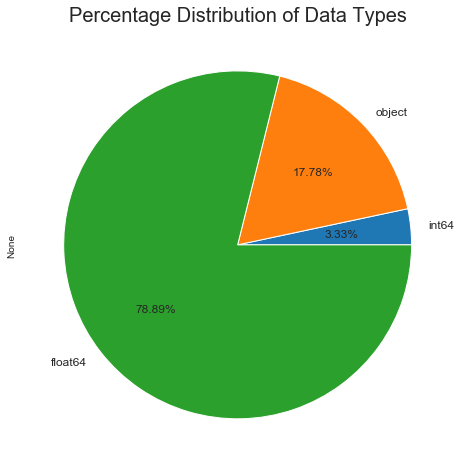

In [75]:
lending.dtypes.value_counts().sort_values().plot.pie(autopct='%1.2f%%', 
                                                   labels=("int64","object","float64"),
                                                   fontsize=12,figsize=(16,8))
plt.title('Percentage Distribution of Data Types',fontsize=20)

Let's take a quick look at the categorical values.  We'll get a distinct count of the categorical data for each attribute.

Text(0, 0.5, 'Categorical Value')

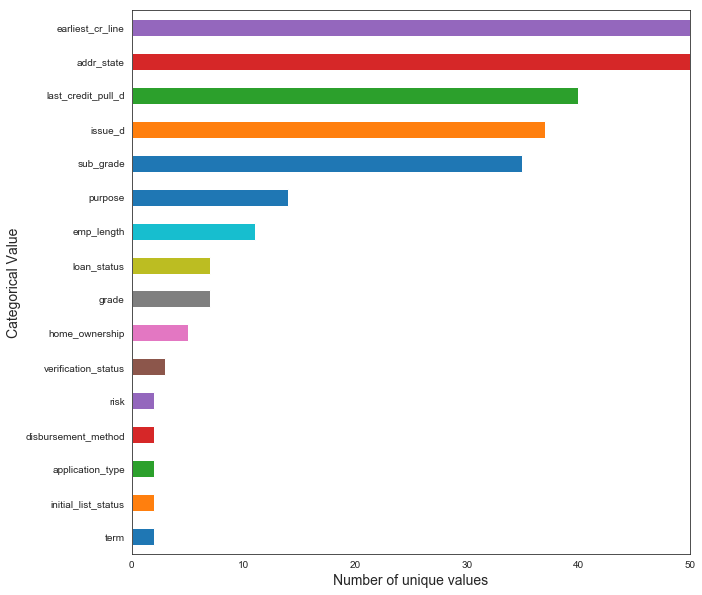

In [87]:
catLabels = lending.select_dtypes('object').apply(pd.Series.nunique, axis = 0).sort_values()
catLabels.plot(kind='barh', figsize=(10,10))
plt.xlim(0,50)
plt.xlabel('Number of unique values', fontsize=14)
plt.ylabel('Categorical Value', fontsize=14)

## Data Dictionary

In [65]:
dataDictionary = pd.read_excel('data/LCDataDictionary.xlsx').dropna()
styler = dataDictionary.style
styler.set_table_styles(
# select the table header with th and set it right align
    [dict(selector="th", props=[("text-align", "center")])]) 
styler.set_properties(**{'text-align': 'left'})
styler.set_properties(subset=['Description'], **{'width': '400px', 'text-align': 'left'})


,LoanStatNew,Description
0,acc_now_delinq,The number of accounts on which the borrower is now delinquent.
1,acc_open_past_24mths,Number of trades opened in past 24 months.
2,addr_state,The state provided by the borrower in the loan application
3,all_util,Balance to credit limit on all trades
4,annual_inc,The self-reported annual income provided by the borrower during registration.
5,annual_inc_joint,The combined self-reported annual income provided by the co-borrowers during registration
6,application_type,Indicates whether the loan is an individual application or a joint application with two co-borrowers
7,avg_cur_bal,Average current balance of all accounts
8,bc_open_to_buy,Total open to buy on revolving bankcards.
9,bc_util,Ratio of total current balance to high credit/credit limit for all bankcard accounts.


# DATA QUALITY
- Explain any missing values 
- Duplicate data 
- Outliers 
- Are those mistakes? 
- Method of dealing with issues? 
- Justification for method 



## Functions & Variables

In [72]:
########################
## Variables
########################
PCT_MISSING = .30                       ## Define % missing
LENDING_PATH = os.path.join("data")     ## Location of data files
LENDING_FILE = "loan.csv"               ## Source data file name
BACKUP_FILE = "backup.csv"              ## Backup data file name

########################
### Functions
### Load Data Set
########################
def load_lending_data(lending_path = LENDING_PATH, lending_file = LENDING_FILE):
    csv_path = os.path.join(lending_path, lending_file)
    return pd.read_csv(csv_path, low_memory=False)

### Load latest backup data set
def load_backup_data(lending_path = LENDING_PATH, backup_file = BACKUP_FILE):
    csv_path = os.path.join(lending_path, backup_file)
    return pd.read_csv(csv_path, low_memory=False)

## Backup current data set
def writeLendingData(lending_path = LENDING_PATH, backup_file = BACKUP_FILE):
    csv_path = os.path.join(lending_path, backup_file)
    lending.to_csv(csv_path, index=None, header=True)

## Drop columns
def drop_irrelevant_columns(columnList):
    dfShape = lending.shape
    lending.drop(columnList, axis=1, inplace=True)  
    print("\nBefore: rows,columns",dfShape,"\nAfter: rows,columns",lending.shape)
    gc.collect()
    
## Let's drop any columns w/more than %30 of the data misssing for now
def remove_NaNs(pctMissing = PCT_MISSING): 
    dfShape = lending.shape
    cols = (lending.isnull().sum()/len(lending))
    cols = list(cols[cols.values>=pctMissing].index)
    lending.drop(labels = cols,axis =1,inplace=True)        
    print("Number of Columns dropped\t: ",len(cols))
    print("\nBefore: rows,columns",dfShape,"\nAfter: rows,columns",lending.shape)

### Let's determine the number of missing values where it's greater than PCT_MISSING
def showMissingValues(pctMissing = PCT_MISSING):
    dfShape = lending.shape
    selectedColumns = lending.isnull().sum()
    return selectedColumns[selectedColumns.values > (pctMissing*len(lending))]
    print("\nBefore: rows,columns",dfShape,"\nAfter: rows,columns",lending.shape)

## Plot missing values based on current PCT_MISSING
def plotMissingValues():
    ## Determine missing values and plot
    missingValues = showMissingValues()
    plt.figure(figsize=(20,4))
    missingValues.plot(kind='bar')
    title = 'Columns where NA > ' + str(PCT_MISSING*100) + '%'
    plt.title(title)
    plt.show

# Drop the rows even with single NaN or single missing values.    
def dropNanRows():
    dfShape = lending.shape
    lending.dropna()
    print("\nBefore: rows,columns",dfShape,"\nAfter: rows,columns",lending.shape)

## Drop Column List

In [2]:
## Remove data not available prior to loan being established.
miscColumns = ['id', 'member_id', 'emp_title', 'desc', 'zip_code', 'title', 
               'url', 'policy_code'
              ]

hardshipColumns = ['hardship_flag', 'hardship_type', 'hardship_reason', 
                   'hardship_status', 'deferral_term', 'hardship_amount', 
                   'hardship_start_date', 'hardship_end_date', 
                   'payment_plan_start_date', 'hardship_length', 'hardship_dpd', 
                   'hardship_loan_status', 'orig_projected_additional_accrued_interest', 
                   'hardship_payoff_balance_amount', 'hardship_last_payment_amount',
                   'pymnt_plan'
                  ]

settlementColumns = ['debt_settlement_flag', 'debt_settlement_flag_date',
                     'settlement_status','settlement_date','settlement_amount', 
                     'settlement_percentage', 'settlement_term'
                    ]

fundsReceviedColumns = ['total_pymnt', 'total_pymnt_inv', 'total_rec_int', 
                        'total_rec_late_fee', 'total_rec_prncp'
                       ]

postLoanInformation = ['out_prncp', 'out_prncp_inv']

loanPaymentColumns = ['last_pymnt_amnt', 'last_pymnt_d','next_pymnt_d',
                      'recoveries'
                     ]

## Load Data & Drop Columns

In [3]:
## Load the data set
lending = load_lending_data()

In [4]:
## Drop irrelevant columns that we are know of
drop_irrelevant_columns(miscColumns)
drop_irrelevant_columns(hardshipColumns)
drop_irrelevant_columns(settlementColumns)
drop_irrelevant_columns(fundsReceviedColumns)
drop_irrelevant_columns(loanPaymentColumns)
drop_irrelevant_columns(postLoanInformation)



Before: rows,columns (2260668, 145) 
After: rows,columns (2260668, 137)

Before: rows,columns (2260668, 137) 
After: rows,columns (2260668, 121)

Before: rows,columns (2260668, 121) 
After: rows,columns (2260668, 114)

Before: rows,columns (2260668, 114) 
After: rows,columns (2260668, 109)

Before: rows,columns (2260668, 109) 
After: rows,columns (2260668, 105)

Before: rows,columns (2260668, 105) 
After: rows,columns (2260668, 103)


## PCT Missing Value Analysis

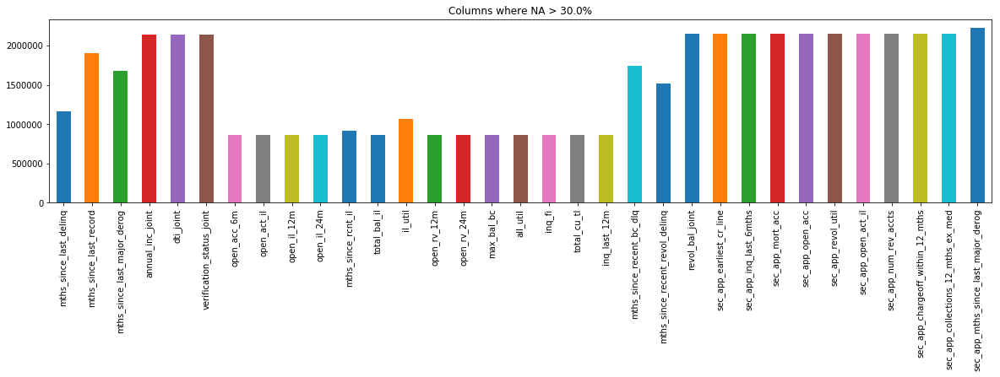

In [5]:
## PCT Missing Analysis
plotMissingValues()

The attributes above have greater than 30% values missing.  Most of these attributes are related to a secondary applicant which makes sense as not all applicants will have a joint or secondary applicant.  Let's determine if we should remove the secondary applicant data.

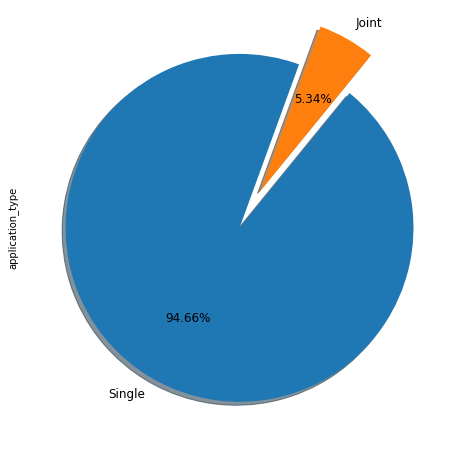

In [6]:
lending["application_type"].value_counts().plot.pie(explode=[0,0.25], autopct='%1.2f%%', 
                                                    shadow=True, labels=("Single","Joint"),
                                                   fontsize=12, startangle=70,figsize=(16,8))



- Secondary applicants makes up less than 5.5% of the data but account for a large number of missing values.  Let's remove the joint applicant data and focus on the primary borrower.

In [7]:
## Create function to drop secondary applicant attributes
def dropJointApplicant():
    jointApplicantColumns = [
                             'sec_app_earliest_cr_line', 'sec_app_inq_last_6mths', 
                             'sec_app_mort_acc', 'sec_app_open_acc', 'sec_app_revol_util', 
                             'sec_app_open_act_il', 'sec_app_num_rev_accts', 
                             'sec_app_chargeoff_within_12_mths', 
                             'sec_app_collections_12_mths_ex_med', 
                             'sec_app_mths_since_last_major_derog',
                             'annual_inc_joint', 'dti_joint', 'revol_bal_joint',
                             'verification_status_joint'
                        ]
    drop_irrelevant_columns(jointApplicantColumns)

## Drop secondary applicant attributes
dropJointApplicant()


Before: rows,columns (2260668, 103) 
After: rows,columns (2260668, 89)


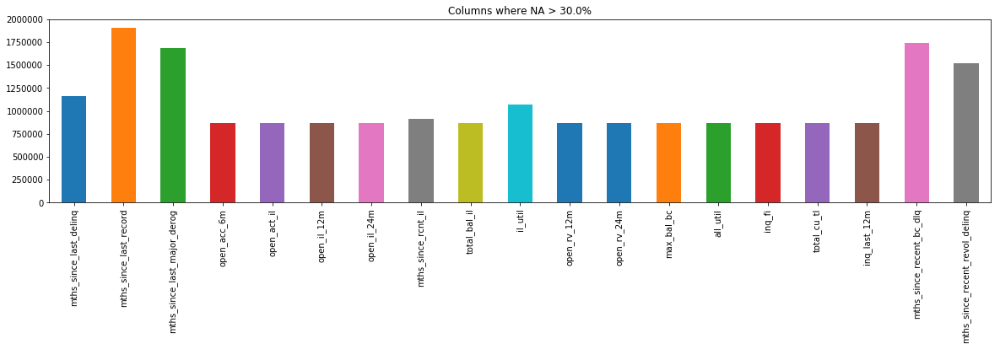

In [8]:
plotMissingValues()

- Let's assume attributes related the number of months since a last event is missing due to the fact that the particular event never occured.  We'll set these values to a large enough value so that lack of an occurence is captured.  We are assuming that smaller values indicate a borrower has a higher risk of defaulting on their loan.

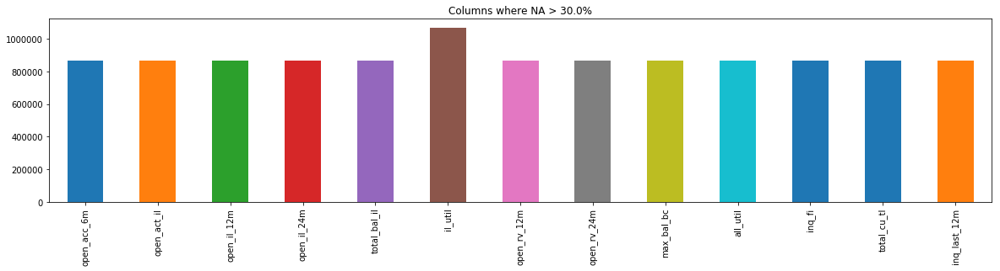

In [9]:
# The number of months since the borrower's last delinquency.
lending['mths_since_last_delinq'].fillna(999, inplace=True)

# Months since most recent 90-day or worse rating
lending['mths_since_last_major_derog'].fillna(999, inplace=True)

# The number of months since the last public record.
lending['mths_since_last_record'].fillna(999, inplace=True)

# Months since most recent installment accounts opened
lending['mths_since_rcnt_il'].fillna(999, inplace=True)

# Months since most recent bankcard account opened.
lending['mths_since_recent_bc'].fillna(999, inplace=True)

# Months since most recent bankcard delinquency
lending['mths_since_recent_bc_dlq'].fillna(999, inplace=True)

# Months since most recent inquiry.
lending['mths_since_recent_inq'].fillna(999, inplace=True)

# Months since most recent revolving delinquency.
lending['mths_since_recent_revol_delinq'].fillna(999, inplace=True)
plotMissingValues()


- Some of the values represent the number of times an event occured.  If the value is NaN, we'll consider the never occured and will set the count to 0.  Opening too many recent accounts could result in the potential borrower being flagged as a risk for default.

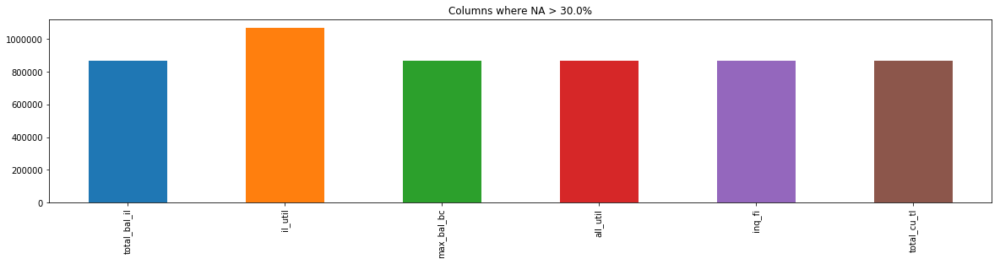

In [10]:
# The number of open credit lines in the borrower's credit file.
lending['open_acc'].fillna(0, inplace=True) 

# Number of open trades in last 6 months
lending['open_acc_6m'].fillna(0, inplace=True)

# Number of installment accounts opened in past 12 months
lending['open_il_12m'].fillna(0, inplace=True)

# Number of installment accounts opened in past 24 months
lending['open_il_24m'].fillna(0, inplace=True)

# Number of currently active installment trades
lending['open_act_il'].fillna(0, inplace=True)

# Number of revolving trades opened in past 12 months
lending['open_rv_12m'].fillna(0, inplace=True)

# Number of revolving trades opened in past 24 months
lending['open_rv_24m'].fillna(0, inplace=True)

# Number of credit inquiries in past 12 months
lending['inq_last_12m'].fillna(0, inplace=True)
plotMissingValues()

Let's remove rows where NaNs as these attributes may be important

- total_bal_il - Total current balance of all installment accounts
- il_tuil - Ratio of total current balance to high credit/credit limit on all install acct
- max_bal_bc - Maximum current balance owed on all revolving accounts
- all_util - Balance to credit limit on all trades
- inq_fi - Number of personal finance inquiries
- total_cu_tl - Number of finance trades


In [11]:
## Drop the rows even with single NaN or single missing values.
dfShape = lending.shape
lending = lending.dropna()
print("\nBefore: rows,columns",dfShape,"\nAfter: rows,columns",lending.shape)

## Check point save data to CSV.  
#writeLendingData()



Before: rows,columns (2260668, 89) 
After: rows,columns (1050374, 89)


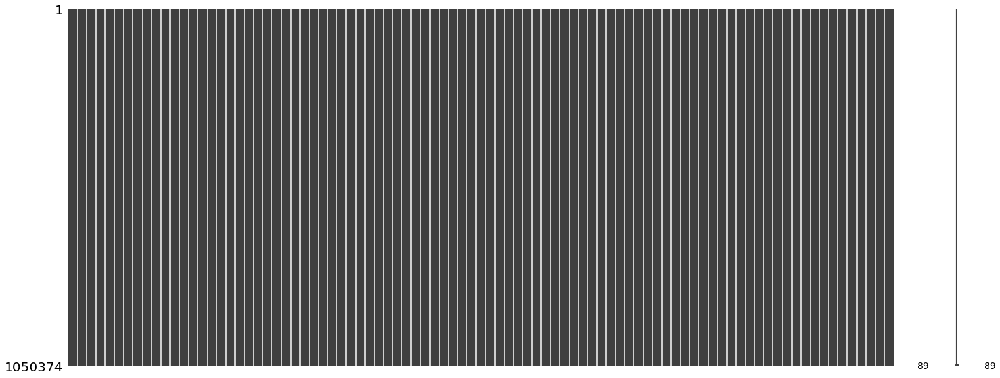

In [12]:
import missingno as msno
msno.matrix(lending)

## Good / Bad Risk

Lending Club's generate revenue by collecting interest payements on loans to its consumers.  The goal with any loan is to have it fully paid back overtime.  Loans that go in default reduces forecasted revenues which impacts investors that are matched with the borrower.  The loan_status column was utilized to determine what percentage of loans were bad.  With the data given, can we come up with an algorithm to better predict borrowers who will either default on would have a higher probability of defaulting on their loans.

First, let's determine from the loan_status columns which loans should be considered bad risk or good risk.  


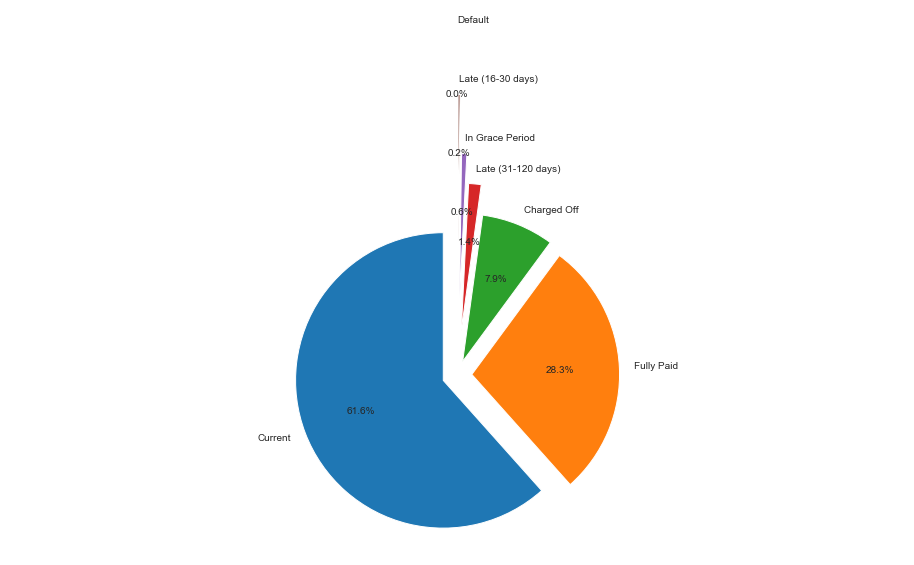

In [88]:
extract = lending["loan_status"].value_counts()
explodeTuple = (0.1, 0.1, 0.1, 0.3, 0.5, 0.9, 1.3)

fig, ax = plt.subplots(figsize=(16, 10), subplot_kw=dict(aspect="equal"))

ax.pie(extract.values, explode=explodeTuple, labels=extract.index, 
       autopct='%1.1f%%', startangle=90)
ax.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()


- We'll define a loan as being a good risk or bad risk based on one of the following: Charged Off, Late, In Grace Period of Default

In [14]:
## Define a good or bad risk
goodLoan = ['Current', 'Fully Paid']

# Use risk definition to define new column
def determineLoanRisk (loan_status_):
    if loan_status_ in goodLoan:
        return 'good'
    else:
        return 'bad'

# Create new column risk which tracks whether this was a good or bad risk.
lending['risk'] = lending['loan_status'].apply(determineLoanRisk)

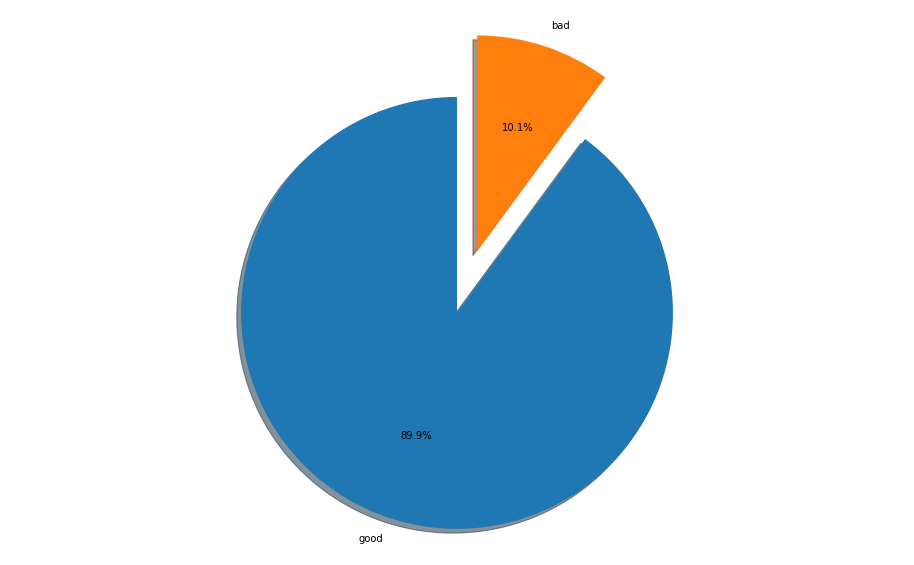

In [15]:
## Plot the ratio of good risk to bad risk
extract = lending["risk"].value_counts()
explodeTuple = (0.0, 0.3)

fig, ax = plt.subplots(figsize=(16, 10), subplot_kw=dict(aspect="equal"))

ax.pie(extract.values, explode=explodeTuple, labels=extract.index, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

- We can now proceed to evaluate the data set to find trend in the data taking risk in consideration. 

In [16]:
############################################################
## Save Current DataSet before running EDA
##
## Saving the current dataset gives us the opportunity
## to jump right into the EDA or model building without
## running all of the data prep code.'''
############################################################
BACKUP_FILE = "preEDA.csv"
writeLendingData()

# Simple Statistics
- Visualize appropriate statistics for a subset of attributes 
    - Range 
    - Mode 
    - Mean 
    - Median 
    - Variance 
    - Counts 
- Describe anything meaningful you found from this or if you found something potentially interesting.  (Note: You can also use data from other sources for comparison.) 
- Explain why the statistics run are meaningful 


## Pandas Profiling Report

In [3]:
## Run to load cleansed data
BACKUP_FILE = "backup.csv"
lending = load_backup_data()

In [3]:
import pandas_profiling as pp
pp.ProfileReport(lending)

# VISUALIZE ATTRIBUTES - James and Alex
- Visualize the most interesting attributes 
    - Minimum of 5 
    - Why are they interesting in your opinion 
- Explain for each attribute why the chosen visualization is appropriate. 


## Most Interesting Attributes

- **Loan Amount (loan_amnt)**: How much has Lending Tree loan out over the past few years.
- **Interest Rate (int_rate)**: Interest Rate on the loan.  What interests rates are borrowers paying.  
- **Grade**: Is there strong correlation between the loan grade and whether or not a borrower defaults.
- **Attribute 4**: It's interesting because
- **Attribute 5**: It's interesting because
- **Attribute 6**: It's interesting because
- **Attribute 7**: It's interesting because
- **Attribute 8**: It's interesting because
- **Attribute 9**: It's interesting because
- **Attribute 10**: It's interesting because

### Loan Amount

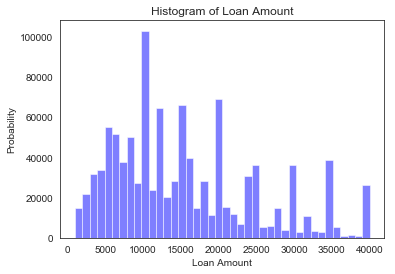

In [41]:
## Loans have an amount.  What's the typical loan amount?
import matplotlib.mlab as mlab
num_bins = 40
mu = lending.loan_amnt.mean()
sigma = lending.loan_amnt.std()

n, bins, patches = plt.hist(lending.loan_amnt, num_bins, facecolor='blue', alpha=0.5)
# add a 'best fit' line
#y = mlab.normpdf(bins, mu, sigma)
#plt.plot(bins, y, 'r--')
plt.xlabel('Loan Amount')
plt.ylabel('Probability')
plt.title(r'Histogram of Loan Amount')
plt.subplots_adjust(left=0.15)
plt.show()

### Interest Rate

### Grade

Lending Club’s interest rates take into account credit risk and market conditions. The final interest rate for each loan grade is the result of the following equation:

**Lending Club Base Rate + Adjustment for Risk & Volatility**

The Adjustment for Risk & Volatility is designed to cover expected losses and provide higher risk-adjusted returns for each loan grade increment from A1 to G5.

The loan grade is the result of a formula that takes into account not only credit score, but also a combination of several indicators of credit risk from the credit report and loan application. All loans have either a 36- or 60-month term, with fixed interest rates and equal payments. [Cited: Lending Tree](https://www.lendingclub.com/foliofn/rateDetail.action)


### Attribute 4

### Attribute 5

### Attribute 6

### Attribute 7

### Attribute 8

### Attribute 9

### Attribute 10

# EXPLORE JOINT ATTRIBUTES - James
- Visualize relationships between attributes 
    - Scatter plots 
    - Correlation 
    - Cross-tabulation 
    - Group-wise averages 
- Explain any interesting relationships 

# EXPLORE ATTRIBUTES AND CLASS - James & Limin
- Identify and explain interesting relationships between features and the class you are trying to predict 
    - Relationships with variables and the target classification 


# NEW FEATURES - Alex
- Are there other features that could be added to the data or created from existing features? 
    - Which ones and why? 


# EXCEPTIONAL WORK - Limin
- Add any additional analyses 
- EXAMPLE:  Implement dimensionality reduction, then visualize and interpret the results 


# Appendix

In [ ]:
lending.info(1)